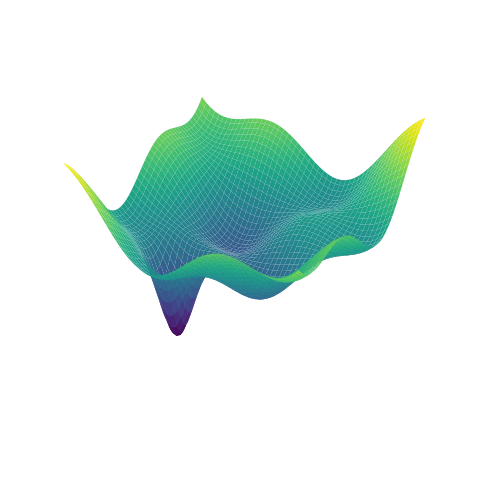

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

# Create a meshgrid
x = np.linspace(-5, 5, 200)
y = np.linspace(-5, 5, 200)
X, Y = np.meshgrid(x, y)

# Define the landscape
Z = (
    np.sin(X) * np.sin(Y) +
    0.1 * (X**2 + Y**2) -
    np.exp(-((X + 2)**2 + (Y + 2)**2)) * 5
)

# Plotting
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap=cm.viridis, edgecolor='none', antialiased=True)

# Remove all decorations
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.set_axis_off()

# Save the figure
# plt.savefig("clean_landscape.png", dpi=300, bbox_inches='tight', pad_inches=0)



In [2]:
import plotly.graph_objects as go
Z = np.sin(1.5 * X) * np.cos(1.5 * Y) - np.exp(-(X**2 + Y**2)) * 4
fig = go.Figure(data=[go.Surface(z=Z, x=X, y=Y, colorscale='Viridis')])
fig.update_layout(scene=dict(xaxis_visible=False, yaxis_visible=False, zaxis_visible=False))
# fig.write_image("plotly_landscape.png", scale=3)  # High-res PNG


In [3]:
import numpy as np
import plotly.graph_objects as go

# Create meshgrid
x = np.linspace(-3, 3, 300)
y = np.linspace(-3, 3, 300)
X, Y = np.meshgrid(x, y)

# Define the landscape: global min + deep local mins
Z = (
    np.sin(1.5 * X) * np.cos(1.5 * Y) +
    0.2 * np.cos(3 * X * Y) -
    np.exp(-(X**2 + Y**2)) * 5
)

# Add deeper local minima
local_minima = [(-2, 2), (2, 2), (-2, -2), (2, -2)]
for (x0, y0) in local_minima:
    Z -= np.exp(-((X - x0)**2 + (Y - y0)**2)) * 1.8

# Custom vibrant color scale
vibrant_colorscale = [
    [0.0, "rgb(165,0,38)"],
    [0.2, "rgb(215,48,39)"],
    [0.4, "rgb(244,109,67)"],
    [0.5, "rgb(255,255,191)"],
    [0.6, "rgb(166,217,106)"],
    [0.8, "rgb(26,150,65)"],
    [1.0, "rgb(0,104,55)"],
]

# Compute min/max for tight contrast
zmin = np.min(Z)
zmax = np.max(Z)

# Plotly surface
fig = go.Figure(
    data=go.Surface(
        z=Z,
        x=X,
        y=Y,
        colorscale=vibrant_colorscale,
        showscale=False,
        cmin=zmin,
        cmax=zmax,
        lighting=dict(ambient=1.0, diffuse=0, specular=0),  # Flatten lighting for color clarity
    )
)

# Styling
fig.update_layout(
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.4),
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor='white',
)

# Save high-res PNG
# fig.write_image("plotly_vibrant_landscape.png", scale=3)
fig.show()


In [4]:
import numpy as np
import plotly.graph_objects as go

# Meshgrid
x = np.linspace(-3, 3, 300)
y = np.linspace(-3, 3, 300)
X, Y = np.meshgrid(x, y)

# Landscape: global + deep local minima
Z = (
    np.sin(1.5 * X) * np.cos(1.5 * Y) +
    0.2 * np.cos(3 * X * Y) -
    np.exp(-(X**2 + Y**2)) * 5
)

# Deeper local minima
local_minima = [(-2, 2), (2, 2), (-2, -2), (2, -2)]
for (x0, y0) in local_minima:
    Z -= np.exp(-((X - x0)**2 + (Y - y0)**2)) * 1.9

# Custom blue-to-red color scale: blue = low, red = high
blue_red_colorscale = [
    [0.0, "rgb(0,0,130)"],     # deep blue
    [0.2, "rgb(0,60,170)"],
    [0.4, "rgb(100,180,255)"],
    [0.5, "rgb(255,255,160)"], # yellowish mid
    [0.7, "rgb(255,150,50)"],
    [1.0, "rgb(180,0,0)"],     # strong red
]

# Compute min/max for tight contrast
zmin = np.min(Z)
zmax = np.max(Z)

# Plotly surface
fig = go.Figure(
    data=go.Surface(
        z=Z,
        x=X,
        y=Y,
        colorscale=blue_red_colorscale,
        showscale=False,
        cmin=zmin,
        cmax=zmax,
        lighting=dict(ambient=1.0, diffuse=0, specular=0),  # flatten lighting
    )
)

# Clean visual style
fig.update_layout(
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.4),
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor='white',
)

# Save high-res PNG
# fig.write_image("plotly_blue_to_red_landscape.png", scale=3)
fig.show()


In [10]:
# Custom blue-to-red color scale: blue = low, red = high
blue_red_colorscale = [
    [0.0, "rgb(0,0,130)"],     # deep blue
    [0.2, "rgb(0,60,170)"],
    [0.4, "rgb(100,180,255)"],
    [0.5, "rgb(255,255,160)"], # yellowish mid
    [0.7, "rgb(255,150,50)"],
    [1.0, "rgb(180,0,0)"],     # strong red
]

# Move global minimum to (0.75, -0.75) -- halfway between center (0,0) and (1.5, -1.5)
Z = (
    np.sin(1.5 * X) * np.cos(1.5 * Y) +
    0.2 * np.cos(3 * X * Y) -
    np.exp(-((X - 0.75)**2 + (Y + 0.75)**2)) * 5
)

# Add deeper local minima as before
for (x0, y0) in local_minima:
    Z -= np.exp(-((X - x0)**2 + (Y - y0)**2)) * 1
zmin = np.min(Z)
zmax = np.max(Z)

fig = go.Figure(
    data=go.Surface(
        z=Z,
        x=X,
        y=Y,
        colorscale=blue_red_colorscale,
        showscale=False,
        cmin=zmin,
        cmax=zmax,
        lighting=dict(ambient=1.0, diffuse=0, specular=0),
    )
)
fig.update_layout(
    scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.4),
    ),
    margin=dict(l=0, r=0, t=0, b=0),
    paper_bgcolor='white',
)
# fig.write_image("plotly_blue_to_red_landscape.png", scale=3)
fig.show()
